BRUTE FORCE ALGORITHM


In [ ]:
# @title Compilelama
brute_comp_dict = {}
greedy_comp_dict = {} # NEVER RECOMPILE

In [ ]:
import networkx as nx
import itertools
import matplotlib.pyplot as plt
import time
from datetime import datetime

# VARIABLES CAN BE CHANGED FOR TESTING PURPOSES
num_samples = 100
num_vertices = 11
density = 0.5

def generate_random_graph(num_vertices, density):
    num_edges = int(num_vertices * (num_vertices - 1) * density / 2)
    return nx.gnm_random_graph(num_vertices, num_edges)

# Generate random graphs
arr_graphs = [generate_random_graph(num_vertices, density) for _ in range(num_samples)]



BRUTE FORCE ALGORITHM

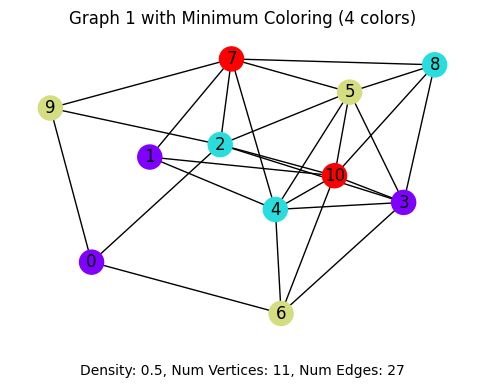

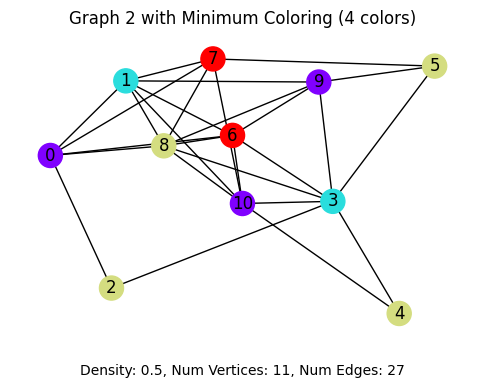

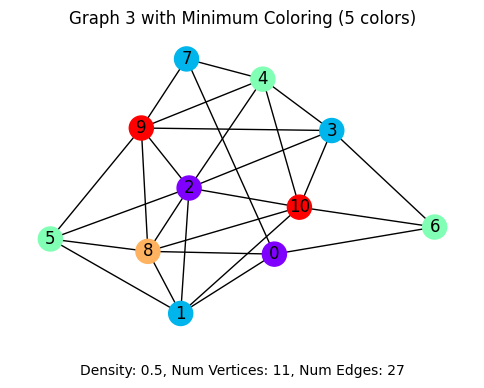

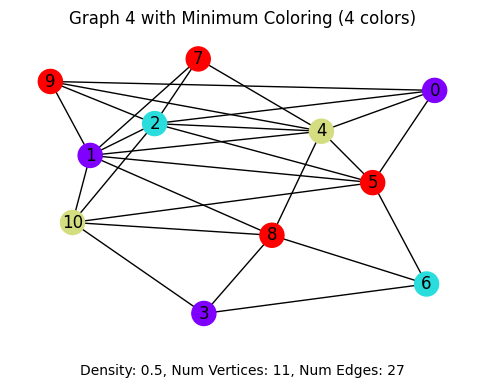

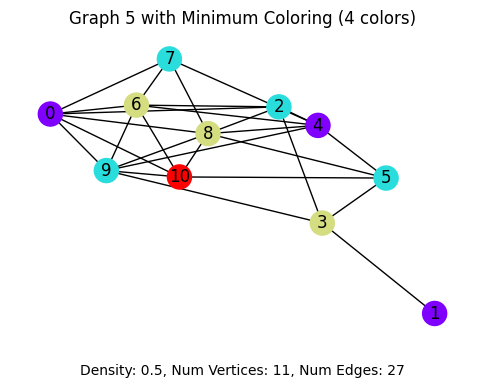

...

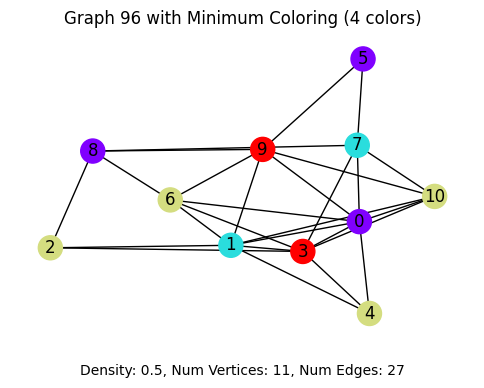

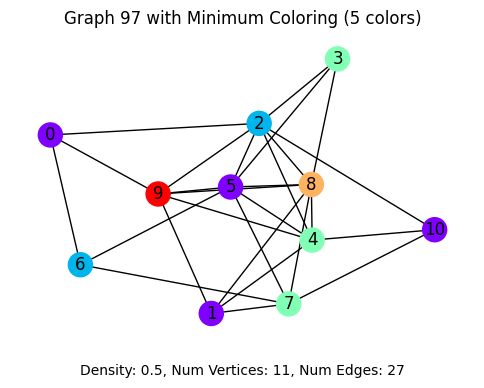

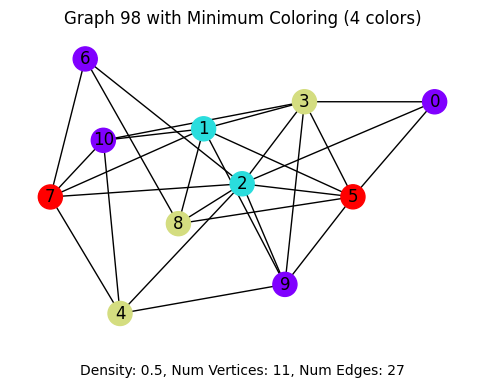

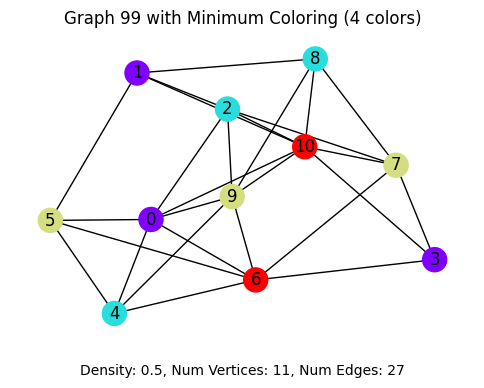

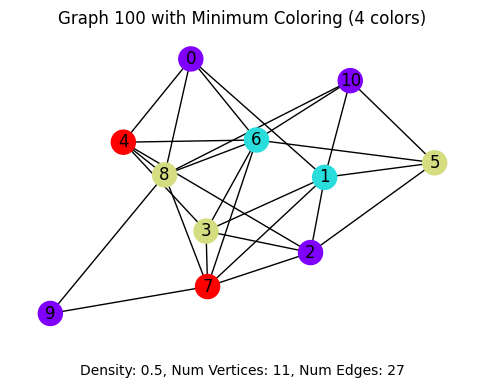

4.14


In [ ]:
def is_valid_coloring(graph, coloring):
    for u, v in graph.edges():
        if coloring[u] == coloring[v]:
            return False
    return True

def brute_force_coloring(graph):
    num_vertices = len(graph.nodes())
    for num_colors in range(1, num_vertices + 1):
        for coloring in itertools.product(range(num_colors), repeat=num_vertices):
            if is_valid_coloring(graph, coloring):
                return num_colors, coloring

total_colors_used = 0
# Measure execution time
start_time = time.time()

# Apply brute force coloring and is_valid_coloring for each graph
for i, graph in enumerate(arr_graphs, start=1):
    # Create a copy of the graph to avoid modifying the original
    graph_copy = graph.copy()

    num_colors, coloring = brute_force_coloring(graph_copy)
    total_colors_used += num_colors

    # Draw the graph with the obtained coloring
    plt.figure(figsize=(6, 4))
    plt.title(f"Graph {i} with Minimum Coloring ({num_colors} colors)")
    pos = nx.spring_layout(graph)
    nx.draw(graph, pos, with_labels=True, node_color=[coloring[node] for node in graph.nodes()], cmap=plt.cm.rainbow)
    plt.text(0.5, -0.1, f"Density: {density}, Num Vertices: {num_vertices}, Num Edges: {graph.number_of_edges()}",
             horizontalalignment='center', verticalalignment='center', transform=plt.gca().transAxes)
    plt.show()

end_time = time.time()
execution_time = end_time - start_time

brute_comp_dict[num_vertices] = execution_time
mean_total_colors_used = total_colors_used / len(arr_graphs)


print(mean_total_colors_used)

GREEDY ALGORITHM

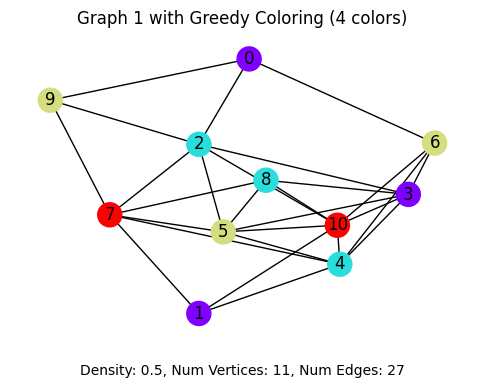

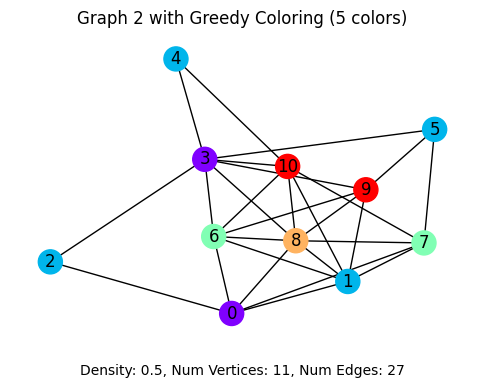

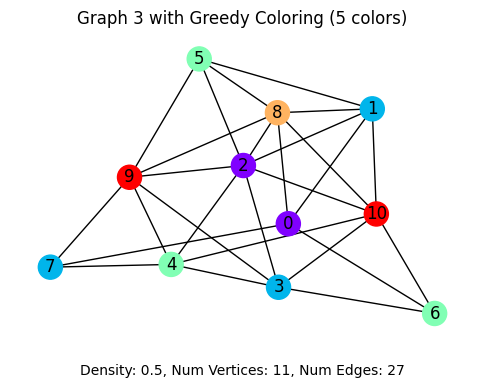

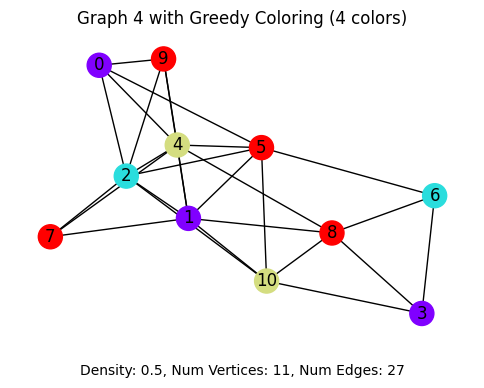

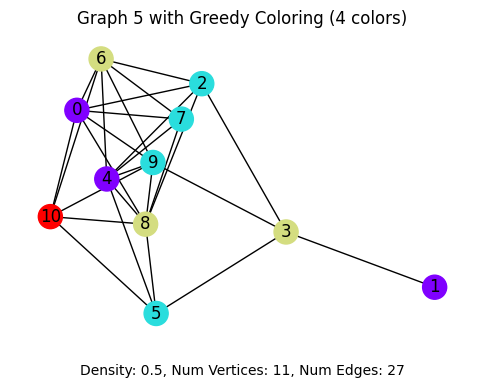

...

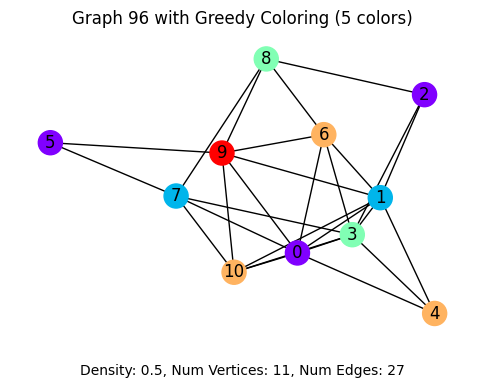

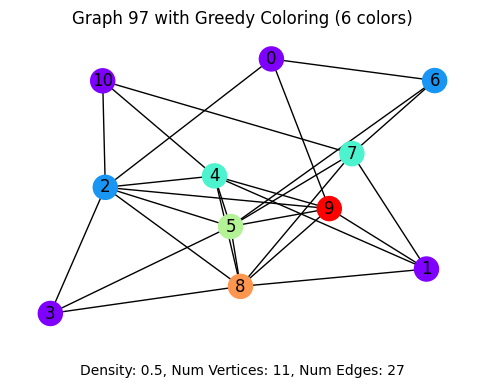

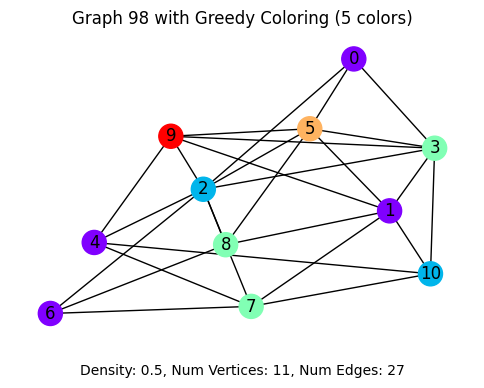

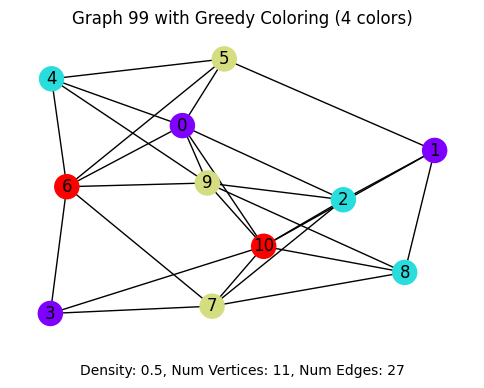

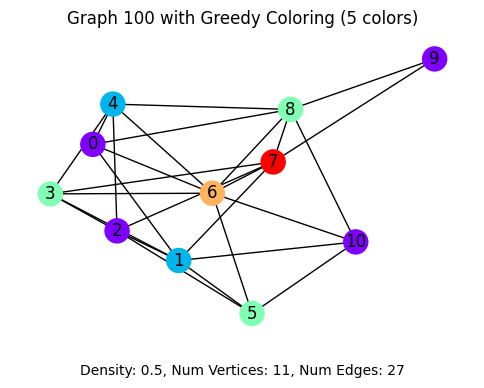

4.67


In [ ]:
# Heuristic Algorithm

def greedy_coloring(graph):
    coloring = {}
    for node in graph.nodes():
        available_colors = set(range(len(graph.nodes())))
        for neighbor in graph.neighbors(node):
            if neighbor in coloring:
                if coloring[neighbor] in available_colors:
                    available_colors.remove(coloring[neighbor])
        coloring[node] = min(available_colors)
    return len(set(coloring.values())), coloring

# Measure execution time
start_time = time.time()
total_colors = 0

for i, graph in enumerate(arr_graphs):
    # Create a copy of the graph to avoid modifying the original
    graph_copy = graph.copy()

    num_colors, coloring = greedy_coloring(graph_copy)
    total_colors += num_colors

    # Plot the Graph
    plt.figure(figsize=(6, 4))
    plt.title(f"Graph {i+1} with Greedy Coloring ({num_colors} colors)")
    pos = nx.spring_layout(graph_copy)
    nx.draw(graph_copy, pos, with_labels=True, node_color=[coloring[node] for node in graph_copy.nodes()], cmap=plt.cm.rainbow)
    plt.text(0.5, -0.1, f"Density: {density}, Num Vertices: {graph_copy.number_of_nodes()}, Num Edges: {graph_copy.number_of_edges()}", horizontalalignment='center', verticalalignment='center', transform=plt.gca().transAxes)

    plt.show()


end_time = time.time()
execution_time = end_time - start_time
#print(f"Total execution time of the Greedy Algorithm: {execution_time:.2f} seconds")
greedy_comp_dict[graph.number_of_nodes()] = execution_time
mean_total_colors = total_colors/len(arr_graphs)

print(mean_total_colors)

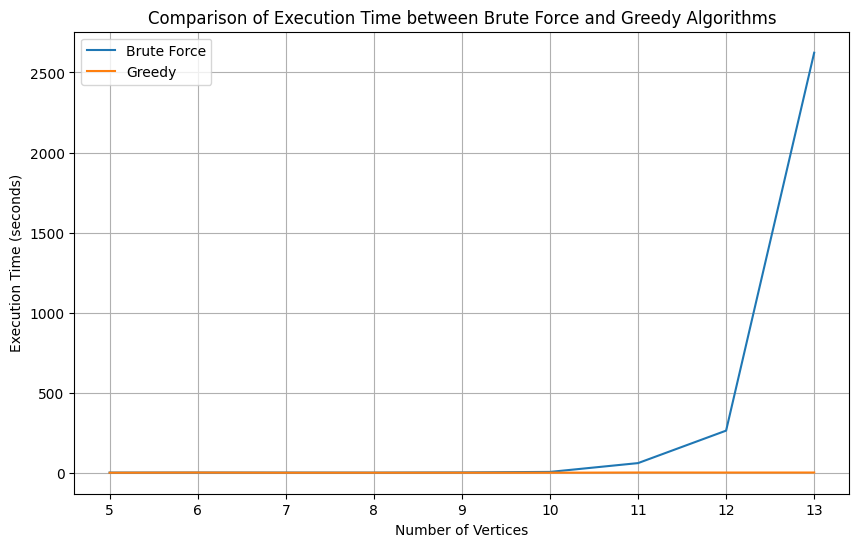

In [ ]:
# Convert execution times from milliseconds to seconds
brute_comp_dict_sec = {key: value for key, value in brute_comp_dict.items()}
greedy_comp_dict_sec = {key: value for key, value in greedy_comp_dict.items()}

# Sort the dictionaries based on keys
brute_comp_dict_sec = dict(sorted(brute_comp_dict_sec.items()))
greedy_comp_dict_sec = dict(sorted(greedy_comp_dict_sec.items()))

# Plotting the data
plt.figure(figsize=(10, 6))
plt.plot(brute_comp_dict_sec.keys(), brute_comp_dict_sec.values(), label='Brute Force')
plt.plot(greedy_comp_dict_sec.keys(), greedy_comp_dict_sec.values(), label='Greedy')
plt.xlabel('Number of Vertices')
plt.ylabel('Execution Time (seconds)')
plt.title('Comparison of Execution Time between Brute Force and Greedy Algorithms')
plt.legend()
plt.grid(True)
plt.show()

TRYING TO SHOW THAT THE MIN NUMBER OF COLORS MAY BE DIFFERENT AND GREEDY ALGORITHM MAY NOT ALWAYS YIELD THE OPTIMAL SOLUTION


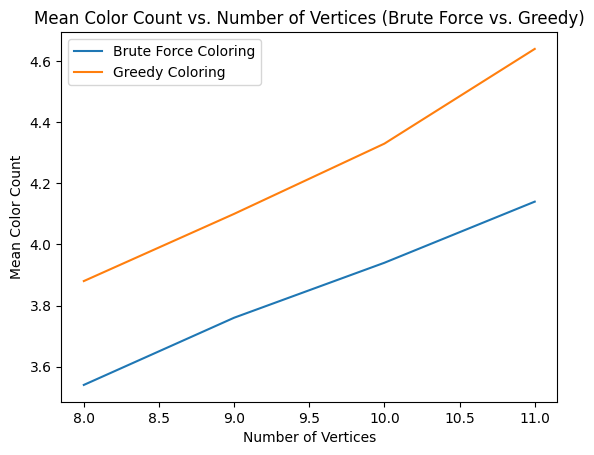

In [ ]:
# Data from the table (assuming you have separate columns for each algorithm)
num_vertices = [8, 9, 10, 11]  # Replace with actual number of vertices data
mean_color_count_brute_force = [3.54, 3.76, 3.94, 4.14]  # Replace with Brute Force data
mean_color_count_greedy = [3.88, 4.1, 4.33, 4.64]  # Replace with Greedy Coloring data

# Create separate lines for each algorithm
plt.plot(num_vertices, mean_color_count_brute_force, label="Brute Force Coloring")
plt.plot(num_vertices, mean_color_count_greedy, label="Greedy Coloring")

# Add labels and title
plt.xlabel("Number of Vertices")
plt.ylabel("Mean Color Count")
plt.title("Mean Color Count vs. Number of Vertices (Brute Force vs. Greedy)")

# Add legend
plt.legend()

# Show the plot
plt.show()